Import library

In [ ]:
from astropy.io import fits
import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.modeling import models, fitting
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob, copy
from scipy import stats
from itertools import chain
from google.colab import drive
from scipy import ndimage

plt.rcParams['figure.figsize'] = (18, 12)

Mount drive

In [ ]:
drive.mount('/content/drive/', force_remount=True)
path_drive = "/content/drive/MyDrive/Colab Notebooks/environment/Galaxi marging/Telescope Data/Spectroscopy/"

Mounted at /content/drive/


# Bias

import bias frame

In [ ]:
files_bias = glob.glob(path_drive+"bias/*.fit")

In [ ]:
bias0 = fits.open(files_bias[0])
bias1=bias0[0].data

In [ ]:
Nfiles = len(files_bias)
ny, nx = np.shape(bias1)

In [ ]:
#Stack bias frames and generate Masterbias
allbias = np.zeros((Nfiles,ny,nx))
#loop over the bias frame
for ind, ff in enumerate(files_bias):
  #open file
  hdu = fits.open(ff)
  #save bias frame
  allbias[ind,...] = hdu[0].data
  #close file
  hdu.close()
#calculate masterbias
masterbias = np.mean(allbias, axis=0)
del allbias

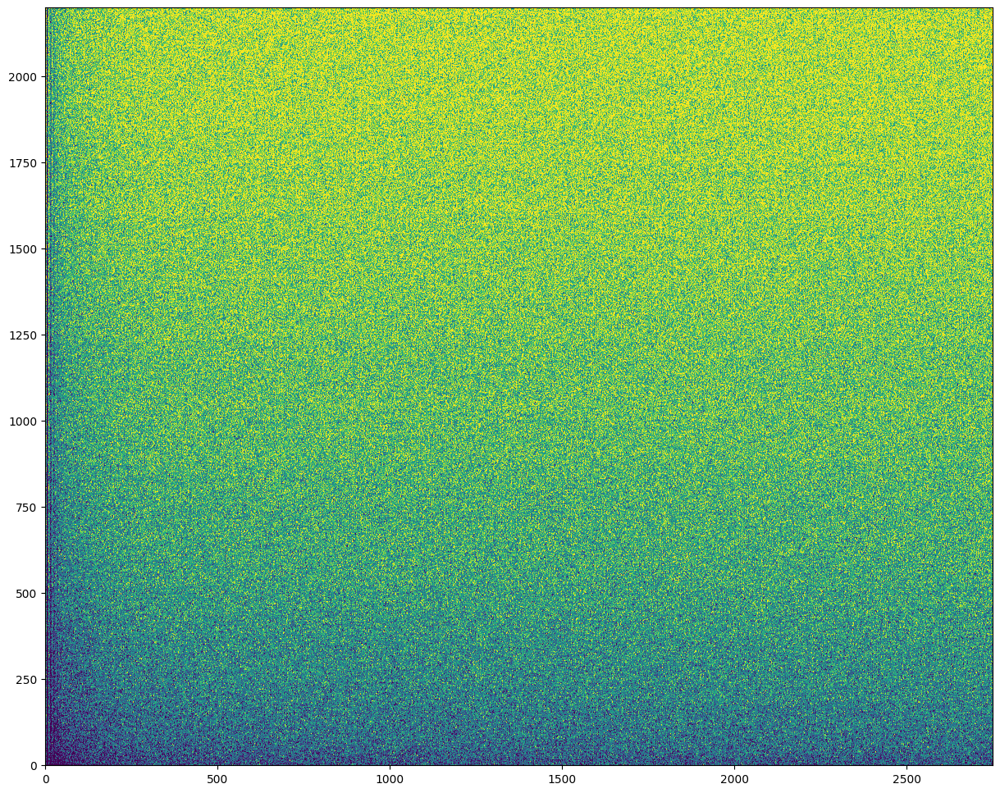

In [ ]:
#print masterbias
plt.imshow(masterbias,clim=[1365,1375], origin='lower')

# Flat

In [ ]:
#import flat frame
files_flat = glob.glob(path_drive+"flat/*.fit")

In [ ]:
files_flat

['/content/drive/MyDrive/Colab Notebooks/environment/Galaxi marging/Telescope Data/Spectroscopy/flat/Image-016.fit',
 '/content/drive/MyDrive/Colab Notebooks/environment/Galaxi marging/Telescope Data/Spectroscopy/flat/Image-017.fit',
 '/content/drive/MyDrive/Colab Notebooks/environment/Galaxi marging/Telescope Data/Spectroscopy/flat/Image-018.fit',
 '/content/drive/MyDrive/Colab Notebooks/environment/Galaxi marging/Telescope Data/Spectroscopy/flat/Image-019.fit',
 '/content/drive/MyDrive/Colab Notebooks/environment/Galaxi marging/Telescope Data/Spectroscopy/flat/Image-020.fit',
 '/content/drive/MyDrive/Colab Notebooks/environment/Galaxi marging/Telescope Data/Spectroscopy/flat/Image-021.fit']

In [ ]:
flat0 = fits.open(files_flat[0])
flat1=flat0[0].data

In [ ]:
ny, nx = np.shape(flat1)
Nfiles = len(files_flat)

In [ ]:
#Stack flat frames and subtract bias (do not normalize flat to 1 yet)
allflat = np.zeros((Nfiles,ny,nx))
#loop over the flat frame
for ind, ff in enumerate(files_flat):
  # open flat frame
  hdu = fits.open(ff)
  #save flats
  allflat[ind,...] = hdu[0].data
  #close flat frame
  hdu.close()
#calculate median of flat frame
masterflat = np.median(allflat, axis=0)

del allflat


In [ ]:
#calculate new image
final_1 = masterflat - masterbias

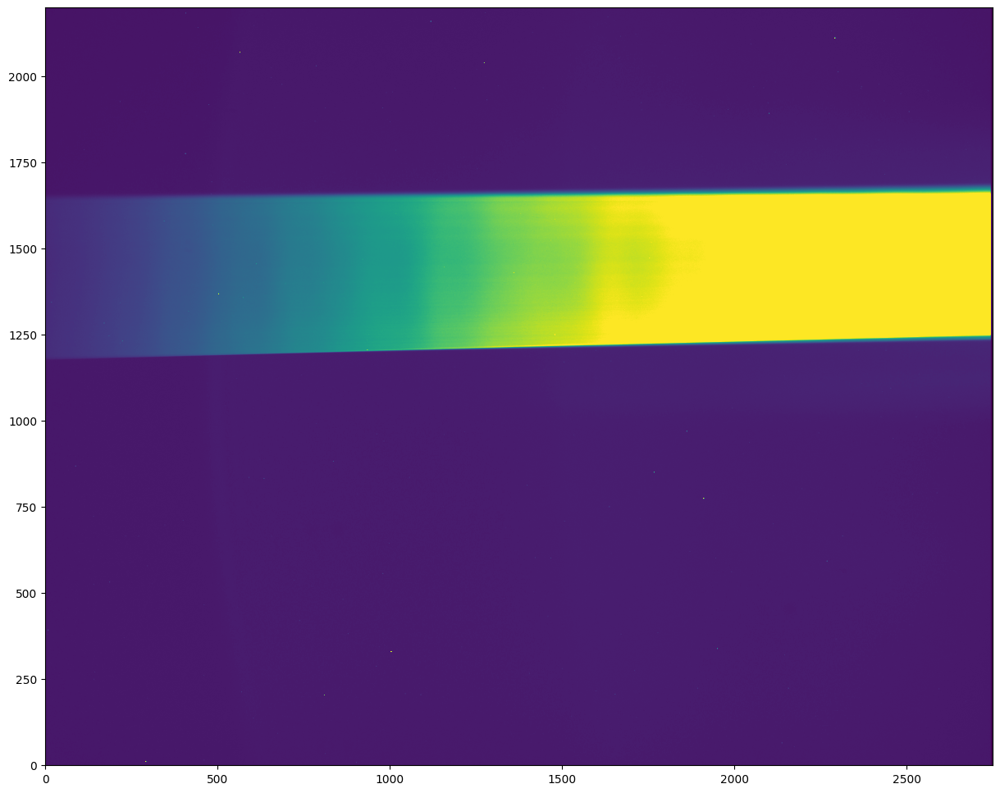

In [ ]:
plt.imshow(final_1,clim=[0,6000], origin='lower')

# Convolutional edges detection

Find the edges of the slit, cut at various columns (x positions), find the edges and then fit linear functions (np.polyfit) to obtain the slit edges

In [ ]:
x_jump=np.arange(100,2650,6)

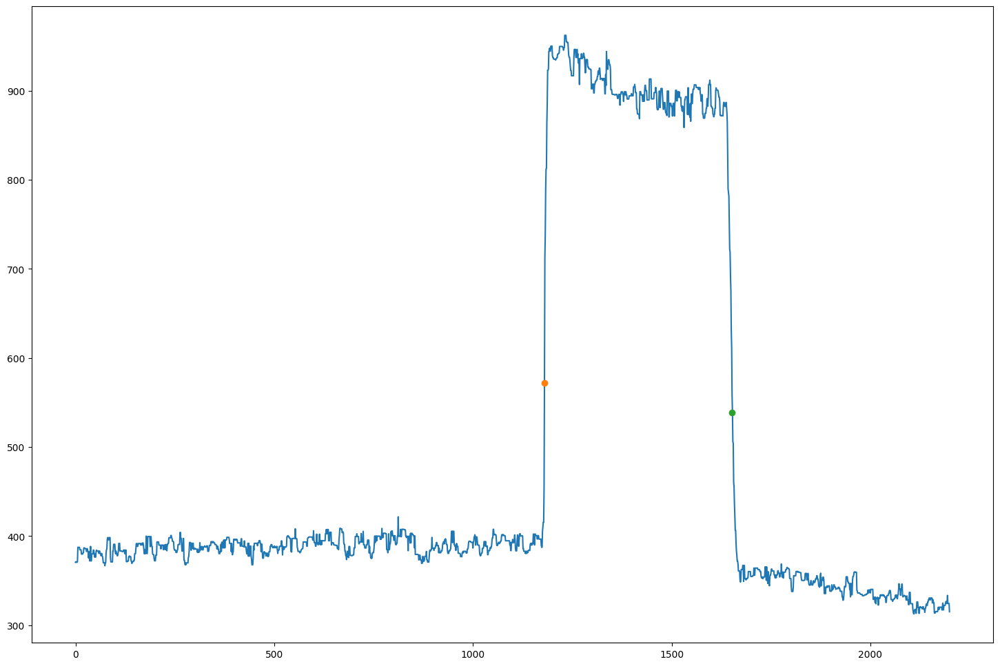

In [ ]:
#final number translate
num_stop = 2190

d_vet=np.zeros(num_stop)
loc_max=np.zeros(len(x_jump))
loc_min=np.zeros(len(x_jump))

val_max=np.zeros(len(x_jump))
val_min=np.zeros(len(x_jump))

#loop on the x vector
for i in range(len(x_jump)):
  #use the median filter to remuve spikes
  final = ndimage.median_filter(final_1[:, x_jump[i]], size=10)
  #create the translate vectors
  d_vet=final[10:]
  final_new = final[:num_stop]
  #calculate the difference verctor
  vett_diff = np.diff([final_new,d_vet])
  #find the min and max position of the diff vector
  loc_max[i] = np.argmax(vett_diff)
  loc_min[i] = np.argmin(vett_diff)
  #evaluete the position find
  val_max[i] = final_1[np.argmax(vett_diff),x_jump[i]]
  val_min[i] = final_1[np.argmin(vett_diff),x_jump[i]]
  #make one plot
  if i==2:
    plt.plot(final)
    plt.plot(loc_max[2],val_max[2],'o')
    plt.plot(loc_min[2],val_min[2],'o')



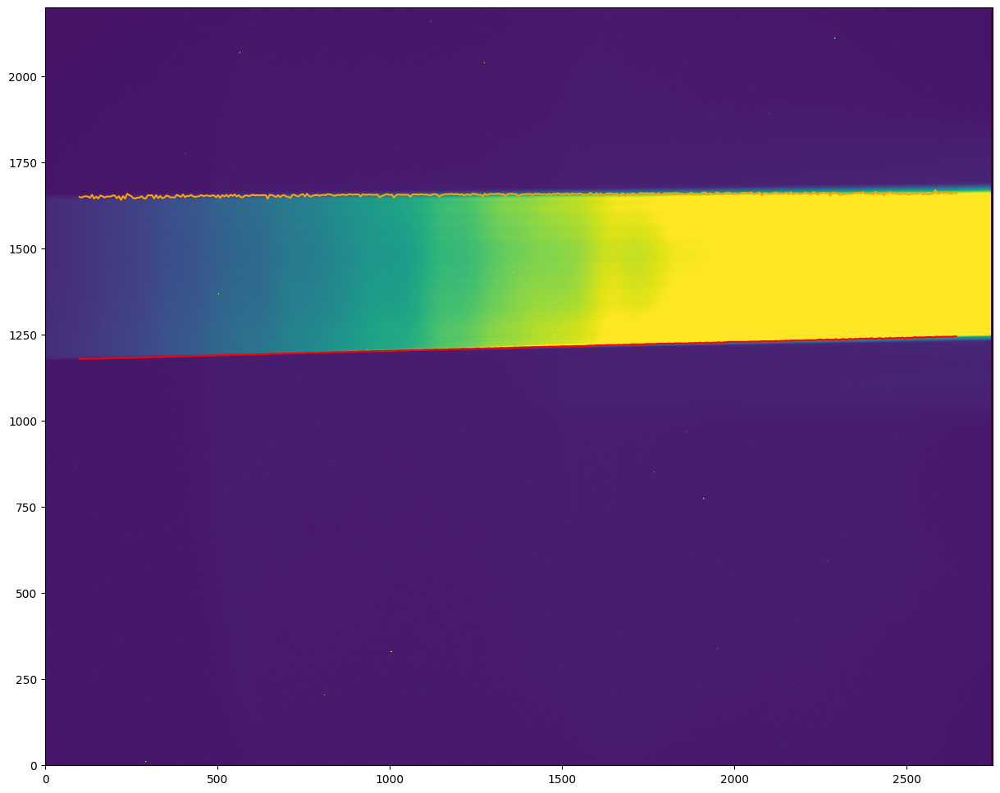

In [ ]:
#plot of the point found
plt.imshow(final_1,clim=[0,6000], origin='lower')
plt.plot(x_jump,loc_max,'red')
plt.plot(x_jump,loc_min,'orange')

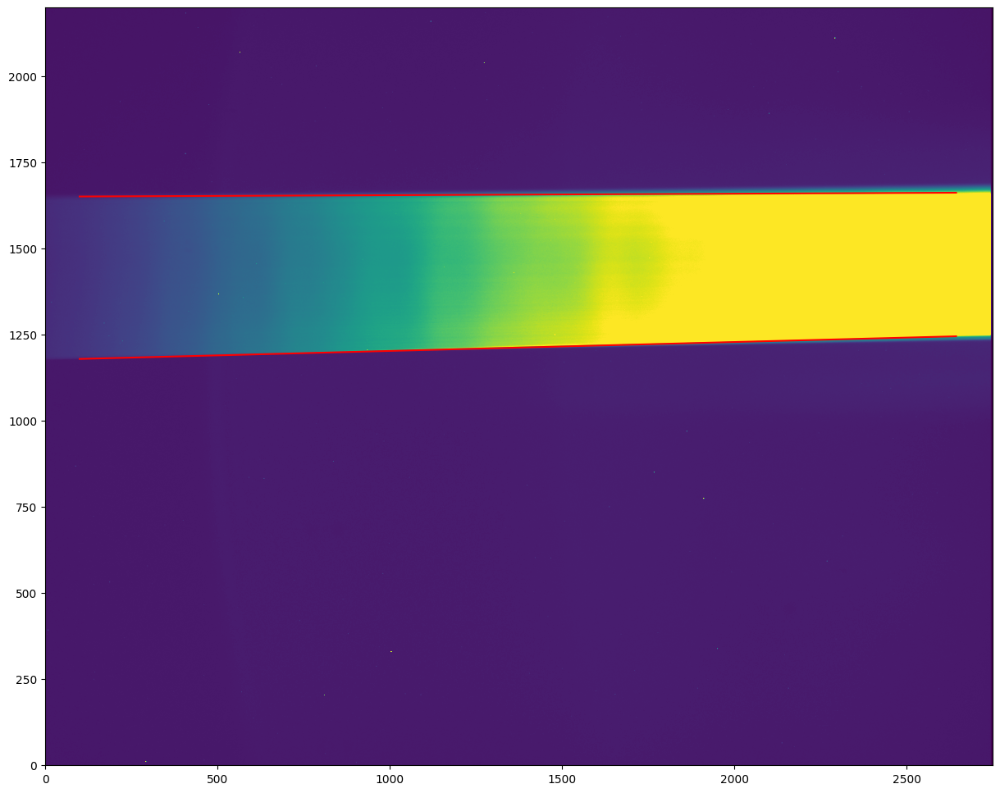

In [ ]:
#fit a line throuth the points
a, b = np.polyfit(x_jump, loc_max,1)
c, d = np.polyfit(x_jump, loc_min,1)
plt.imshow(final_1,clim=[0,6000], origin='lower')
plt.plot(x_jump, a*x_jump+b,'red')
plt.plot(x_jump, c*x_jump+d,'red')

Generate a mask of pixels bound by the slit edges and normalize flat to a median of one in that region

<ipython-input-21-8d2e31459dc9>:12: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cond1 = np.array(cond1).astype(np.bool)
<ipython-input-21-8d2e31459dc9>:13: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cond2 = np.array(cond2).astype(np.bool)


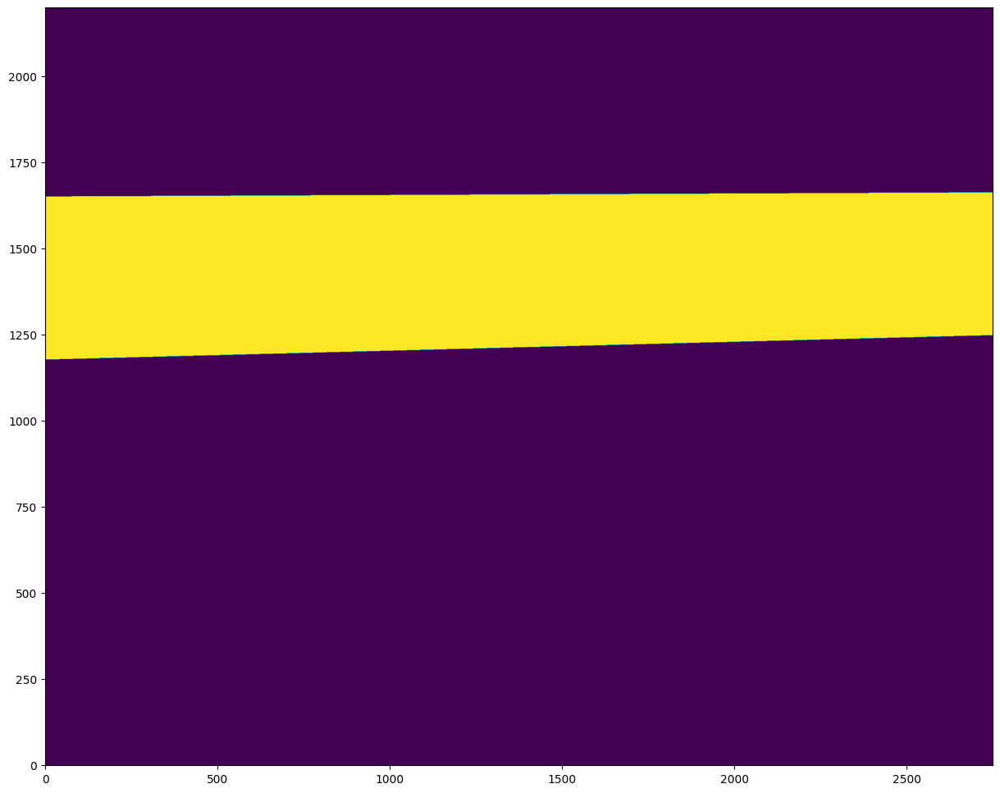

In [ ]:
#calculate the mask
y_mask = np.arange(0,2200,1)
#create the condition verctor
cond1 = np.zeros(final_1.shape)
cond2 = np.zeros(final_1.shape)

for i in range(2750):
  #calculate condition vector
  cond1[:,i] = c*i+d>y_mask
  cond2[:,i] = a*i+b<y_mask
#translate to boolean vector
cond1 = np.array(cond1).astype(np.bool)
cond2 = np.array(cond2).astype(np.bool)
#calculate the mask
mask = np.where(cond1 & cond2, 1,0)
#plot the mask
plt.imshow(mask, origin='lower')

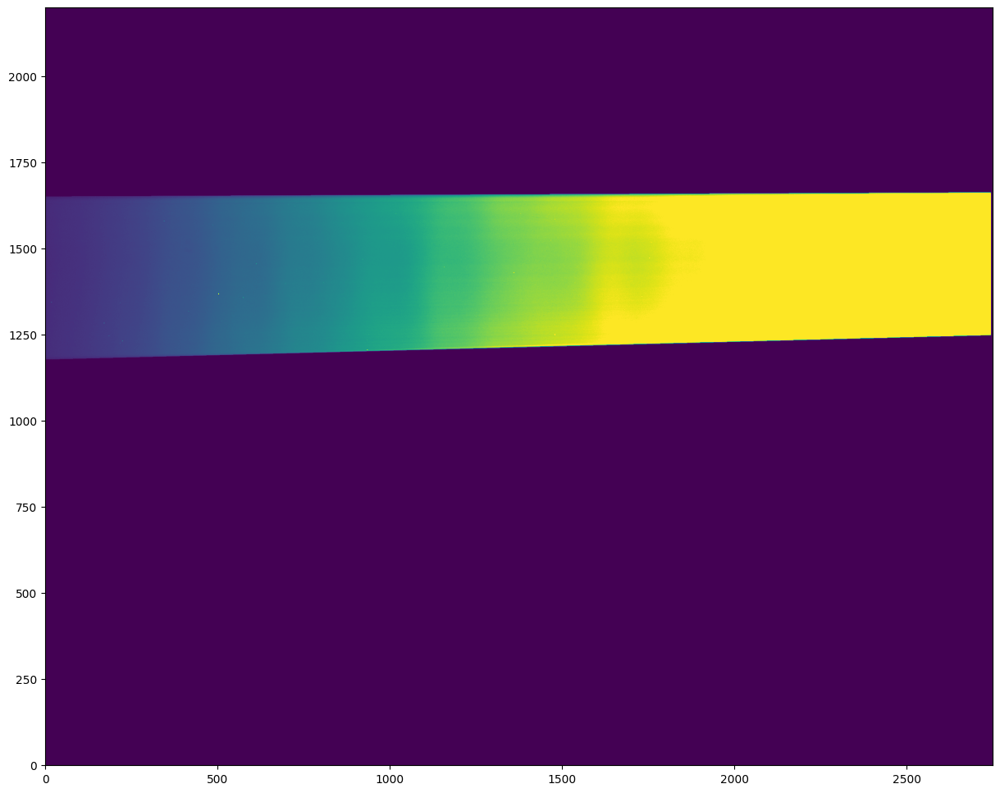

In [ ]:
#calculate finale image
image_with_mask = final_1*mask
plt.imshow(image_with_mask, clim=[0,6000],origin='lower')

# Science image loading

In [ ]:
#open the image
IMMAG = glob.glob(path_drive+"science/HD3360_30s.fit")
IMMAG

['/content/drive/MyDrive/Colab Notebooks/environment/Galaxi marging/Telescope Data/Spectroscopy/science/HD3360_30s.fit']

In [ ]:
IMMAG_data = fits.open(IMMAG[0])[0].data

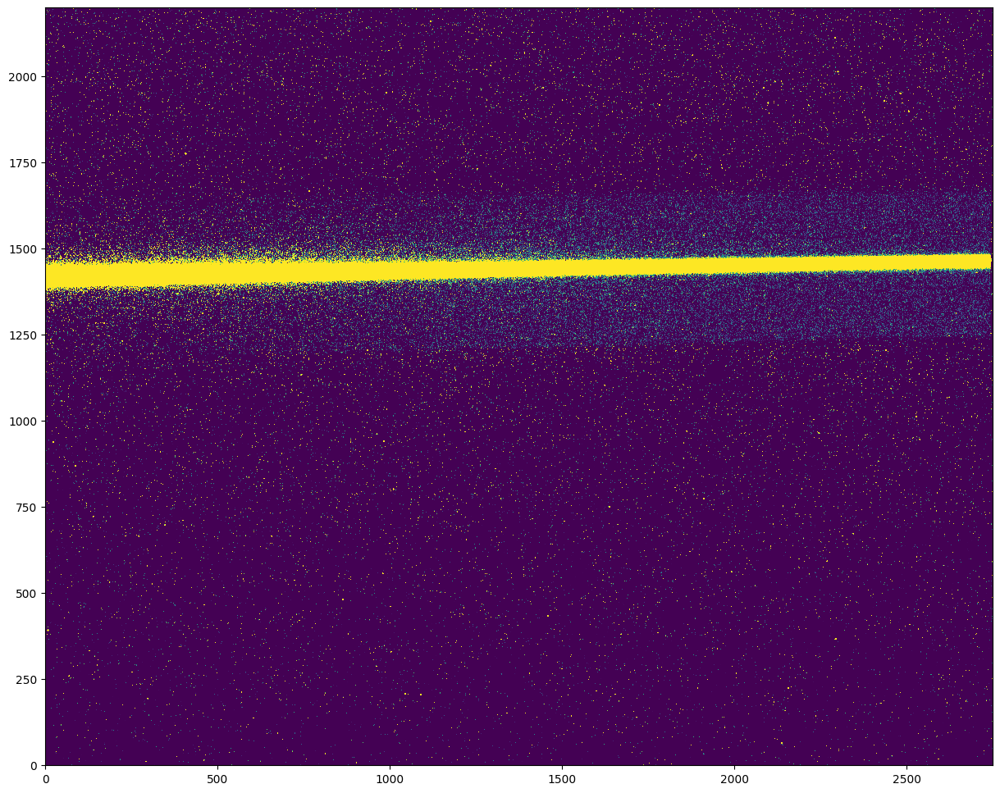

In [ ]:
#calculate the mean of the flat image
mean_image_with_mask = image_with_mask[np.where(image_with_mask != 0)].mean()
#calculate the normflat
normflat = masterflat/mean_image_with_mask
#subtract the mastebias
IMMAG_0 = IMMAG_data-masterbias
#divide for teh normflat
IMMAG_0_flat = IMMAG_0/normflat
#plot the image
plt.imshow(IMMAG_0_flat, clim=[-4,4], origin='lower')

## Subregion selection

In [ ]:
 #number of pixel above and below the star to consider
width=60
ycent = 1435

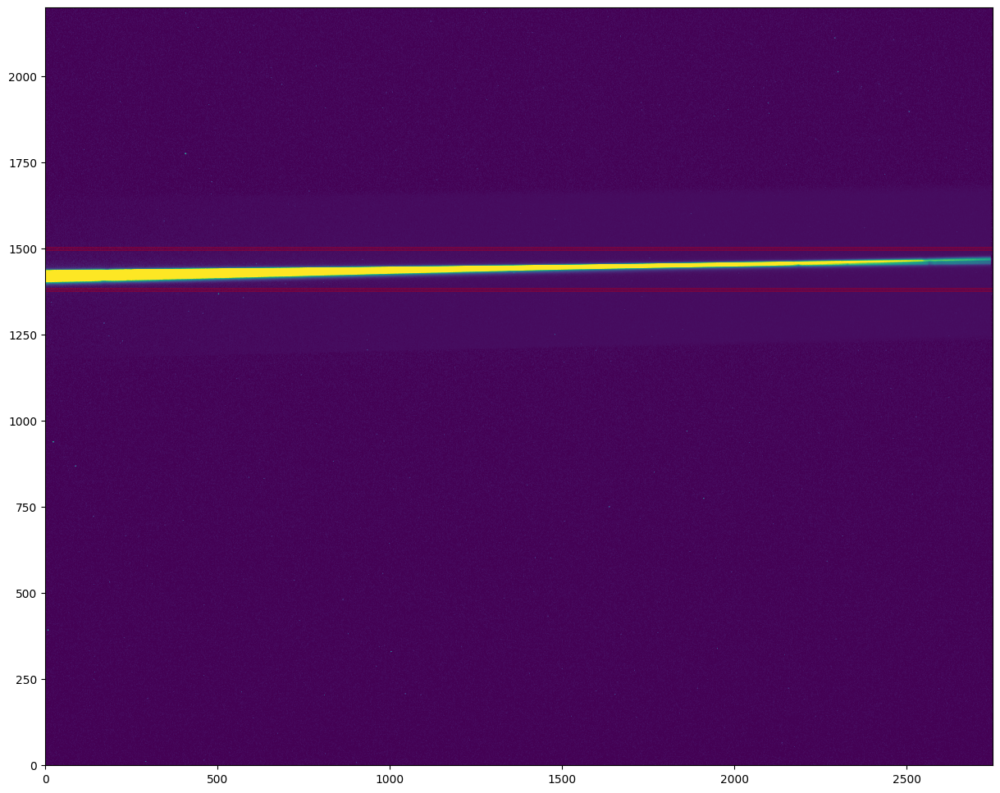

In [ ]:
#plot stripe
plt.imshow(IMMAG_0_flat,clim=[-40,1000], origin='lower')
#select the subregion
stripe_cen_up=np.full((1,2750), 1500)
stripe_cen_dn=np.full((1,2750), 1380)
xarr=np.arange(0,2750,1)
#plot the suubregion
plt.scatter(xarr, stripe_cen_up, s=0.001, color = 'red', linewidth = 3)
plt.scatter(xarr, stripe_cen_dn, s=0.001, color = 'red', linewidth = 3)
plt.savefig("IMMAG_stripe_center.png")

plt.show()



In [ ]:
#Sum the image along the rows to obtain a spectrum of the source
star_spec = np.zeros((2750))
for i in xarr:
  star_spec[i] = IMMAG_0_flat[1380:1500,i].sum()
star_spec = np.array(star_spec)

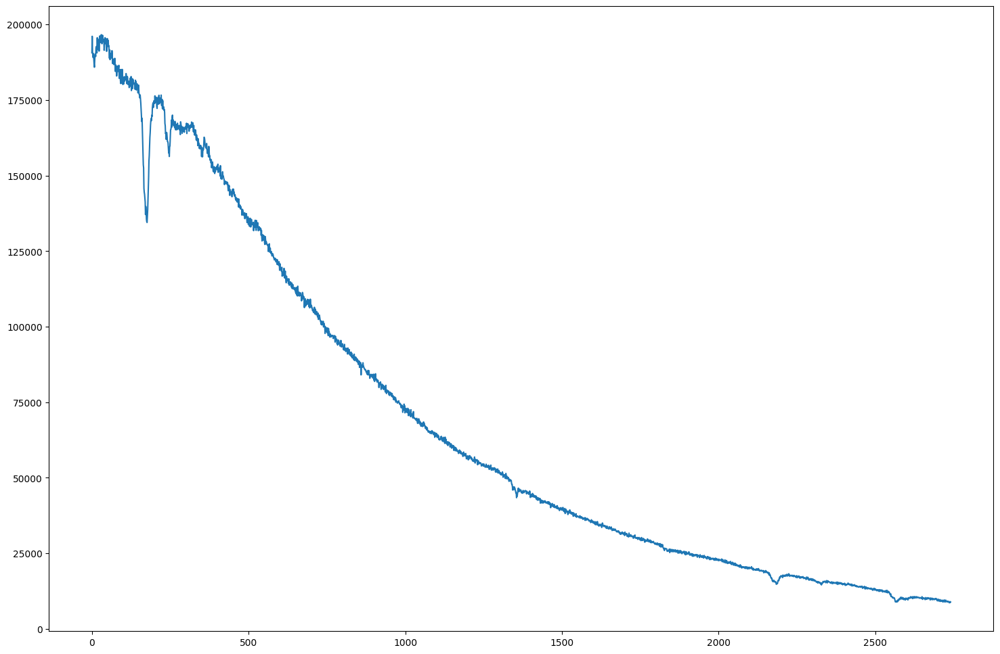

In [ ]:
#plot the spectrum
plt.plot((star_spec)[:-9])

# Wavelenght mapping

In [ ]:
#import file arc
files_arc = glob.glob(path_drive+"arc/*.fit")

In [ ]:
#Stack arc frames
allarc = np.zeros((Nfiles,ny,nx))

for ind, ff in enumerate(files_arc):
  hdu = fits.open(ff)
  allarc[ind,...] = hdu[0].data
  hdu.close()

meanarc = np.mean(allarc, axis=0)
del allarc


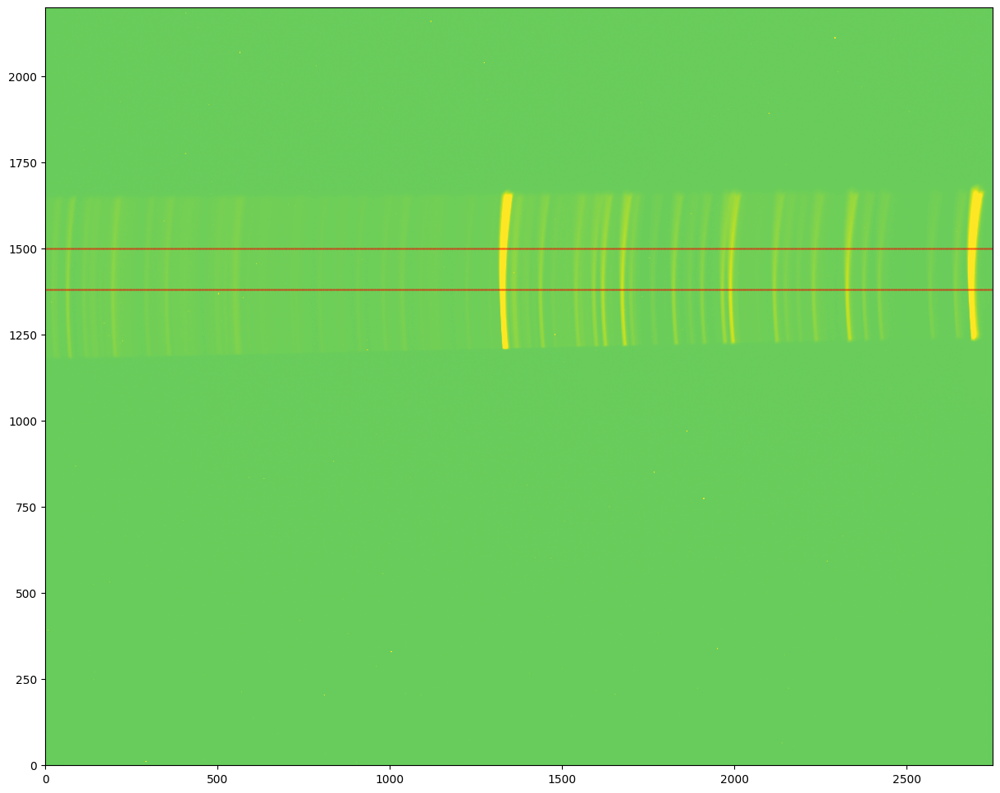

In [ ]:
#plot mean arc frame
plt.imshow(meanarc, clim=[-1000,1200], origin='lower')
#plot subregion
plt.scatter(xarr,stripe_cen_up,s=0.01,c='r')
plt.scatter(xarr,stripe_cen_dn,s=0.01,c='r')

extract arc in the same region where you extracted the source spectrum

In [ ]:
star_spec_arc=np.zeros((2750))
for i in xarr:
  star_spec_arc[i]=meanarc[1380:1500,i].sum()

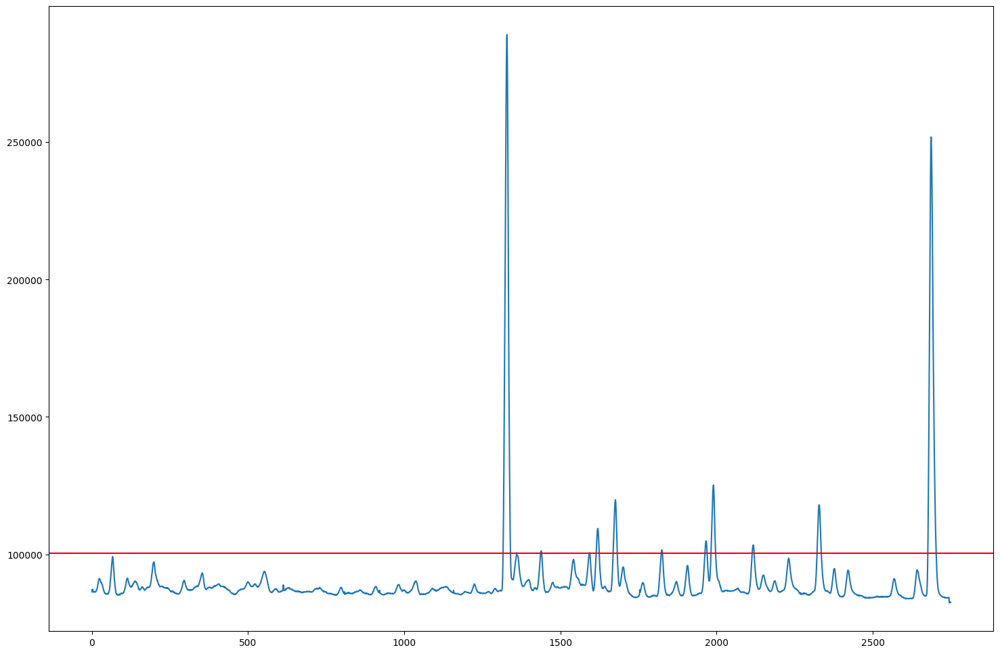

In [ ]:
#plot the spectrum extracted
plt.plot((star_spec_arc))
#the cut spectrum extracted
yheight=100300
plt.axhline(y=yheight, color='r', linestyle='-')

In [ ]:
from scipy.signal import find_peaks
x = star_spec_arc
#find the peak of the spectrum
peaks, _ = find_peaks(x, height=yheight)
peaks

array([1329, 1360, 1439, 1594, 1620, 1676, 1825, 1966, 1990, 2118, 2328,
       2687])

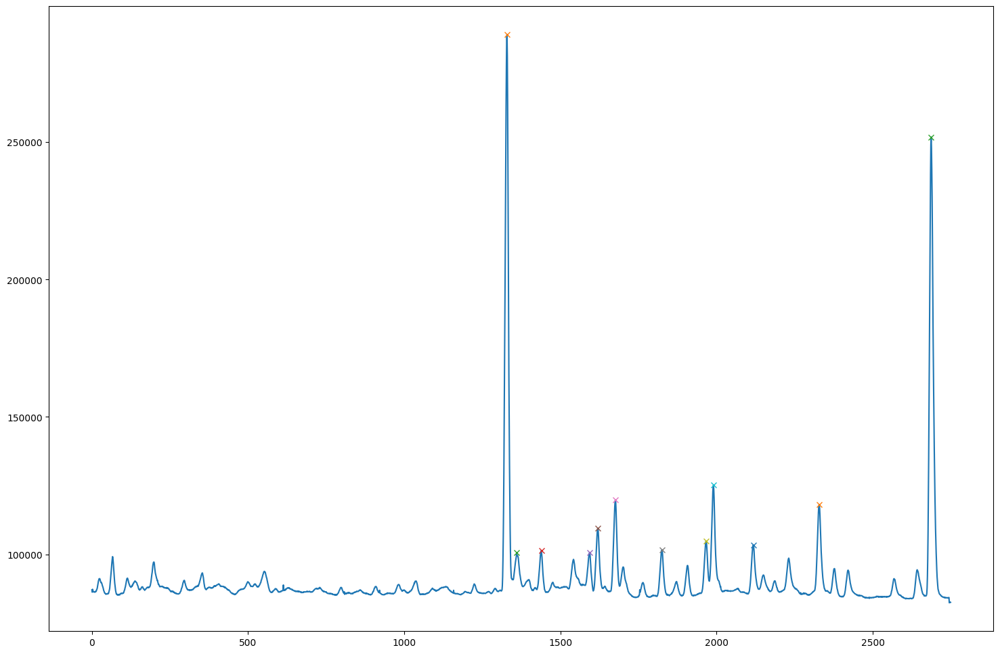

In [ ]:
#plot the peaks find
plt.plot(x)
for i in range(0, len(peaks)):
    plt.plot(peaks[i], x[int(peaks[i])], "x")
plt.show()

In [ ]:
#define the funtion to translate from the pixel to the wavelenght
def pixel_to_wavelenght(pixel):
    return regr.coef_[0]*pixel + regr.intercept_

## Using tabulated arc lines

In [ ]:
#wavelenght calibration
wavelenght_calib_red = [5852.488, 5881.895, 5944.834, 6096.163, 6143.063, 6266.495, 6382.992, 6402.246, 6506.528, 6678.276,6965.491]
print('Number of identified lines in red: {}'.format(len(wavelenght_calib_red)))


Number of identified lines in red: 11


### Run calib in red

In [ ]:
x = star_spec_arc
yheight_accu=100550
peaks_red, _ = find_peaks(x, height=yheight_accu)
peaks_red

array([1329, 1360, 1439, 1620, 1676, 1825, 1966, 1990, 2118, 2328, 2687])

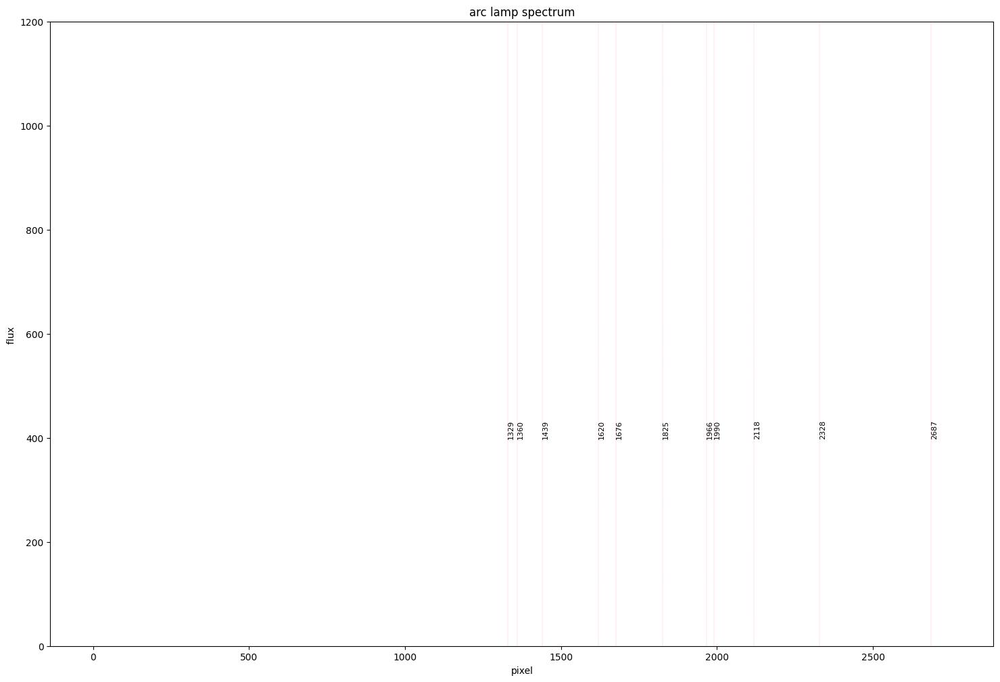

In [ ]:
plt.plot(star_spec_arc)
plt.xlabel("pixel")
plt.ylabel("flux ")
plt.title("arc lamp spectrum")
for i in peaks_red:
        plt.text(i, 400, f'{i}', rotation=90,size=8)
        plt.axvline(x=i, color='r', linestyle='dashdot', linewidth=0.1)
plt.ylim((0,1200))
plt.savefig("calibration_pix_red.png", dpi=450)

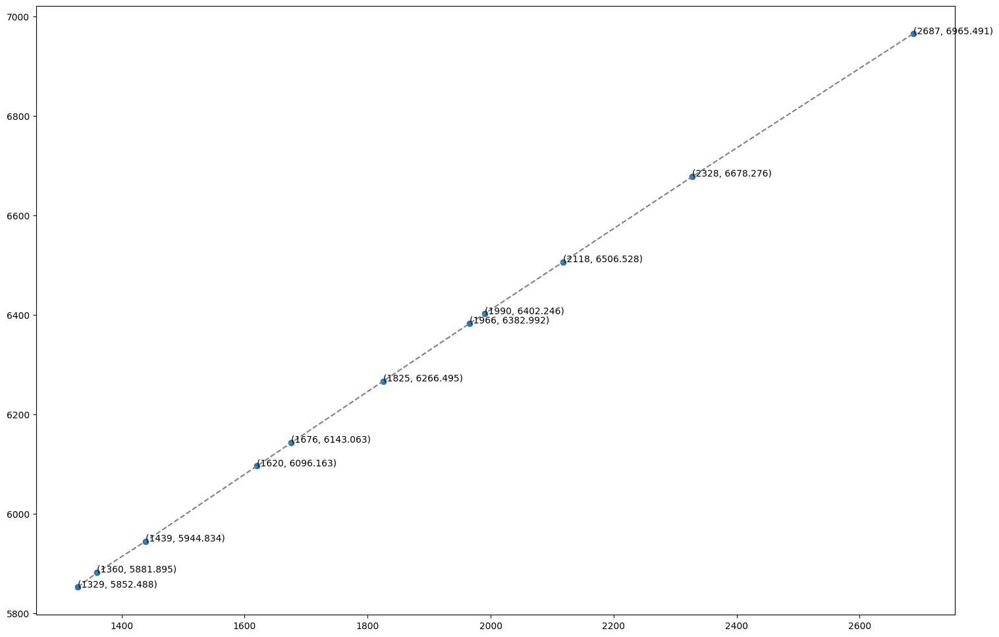

In [ ]:
#fit the peaks
plt.plot(peaks_red, wavelenght_calib_red, '--', color="gray")
plt.scatter(peaks_red, wavelenght_calib_red)
for i, j in zip(peaks_red, wavelenght_calib_red):
   plt.text(i, j+0.5, '({}, {})'.format(i, j))

Text(0, 0.5, 'wavelenght')

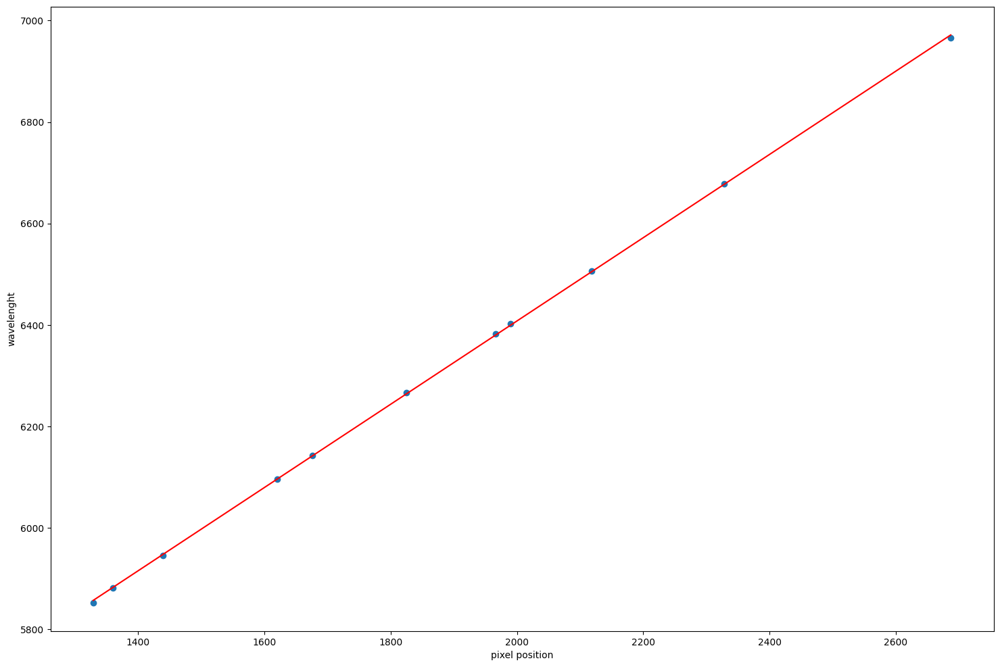

In [ ]:
# Create linear regression object
fit_red = np.polyfit(peaks_red,wavelenght_calib_red,1)
wavelenght_pred_red = np.polyval(fit_red, peaks_red)

# Plot outputs
plt.scatter(peaks_red, wavelenght_calib_red)
plt.plot(peaks_red, wavelenght_pred_red, color="red")
plt.xlabel("pixel position")
plt.ylabel("wavelenght")

In [ ]:
print("The conversion between pixel and wavelenght is: lambda = ", round(fit_red[0],4), "* pixel + ", round(fit_red[1],2))

The conversion between pixel and wavelenght is: lambda =  0.8208 * pixel +  4766.09


### Run calib in blu

In [ ]:
x = star_spec_arc
yheight_accu=91500
#Now repeat in the blue part of the spectrum, find the four strongest peaks above 160 counts

In [ ]:
x = star_spec_arc
x=x[:1300]
peaks_blue, _ = find_peaks(x, height = yheight)
#peaks_blue = np.delete(peaks_blue, (3,5))
peaks_blue

array([ 66, 198, 354, 552])

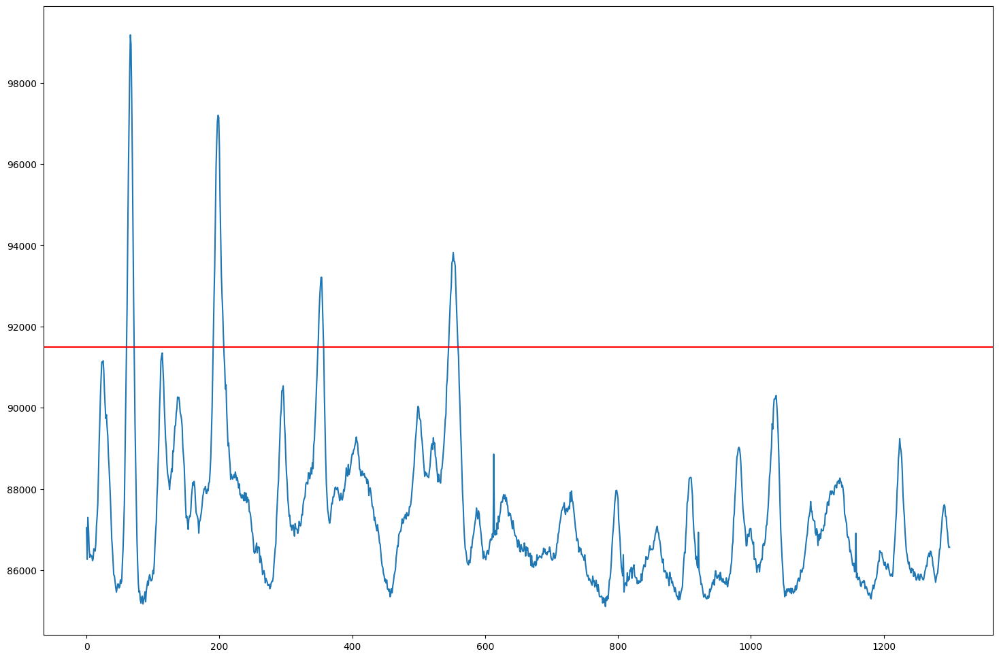

In [ ]:
plt.plot((x))
yheight=91500
plt.axhline(y=yheight, color='r', linestyle='-')

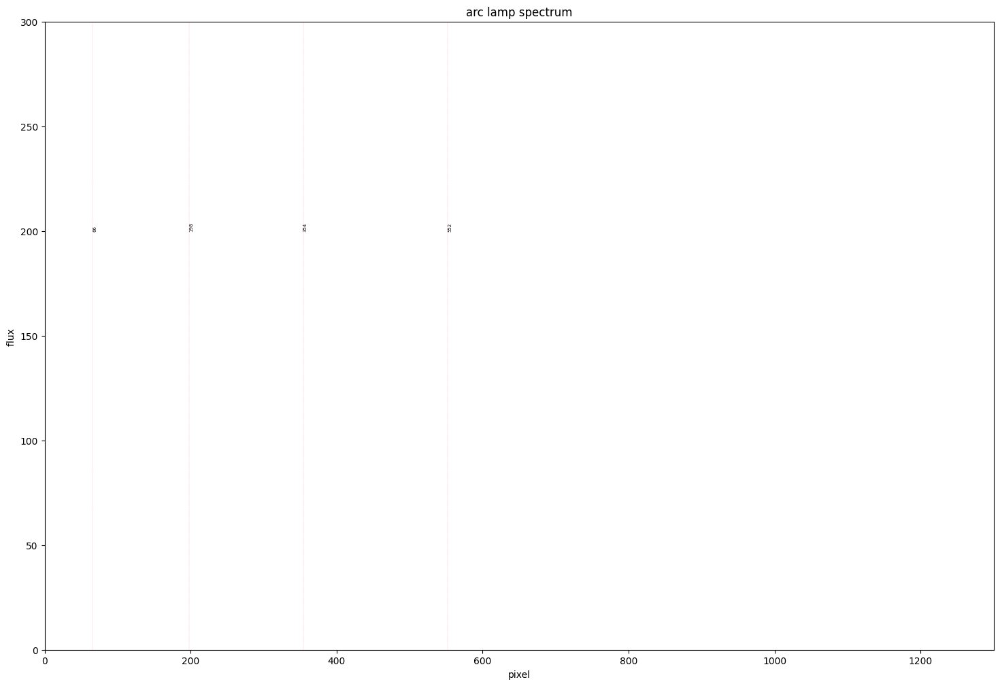

In [ ]:
plt.plot(x)
plt.xlabel("pixel")
plt.ylabel("flux ")
plt.title("arc lamp spectrum")
for i in peaks_blue:
        plt.text(i, 200, f'{i}', rotation=90, size=5)
        plt.axvline(x=i, color='r', linestyle='dashdot', linewidth=0.1)
plt.ylim(0,300)
plt.xlim(0,1300)
plt.savefig("calibration_pix_blu.png", dpi=450)

In [ ]:
wavelenght_calib_blu = [4764.865, 4879.209, 5017.163, 5187.746]
print('Number of identified lines in blue: {}'.format(len(wavelenght_calib_blu)))

Number of identified lines in blue: 4


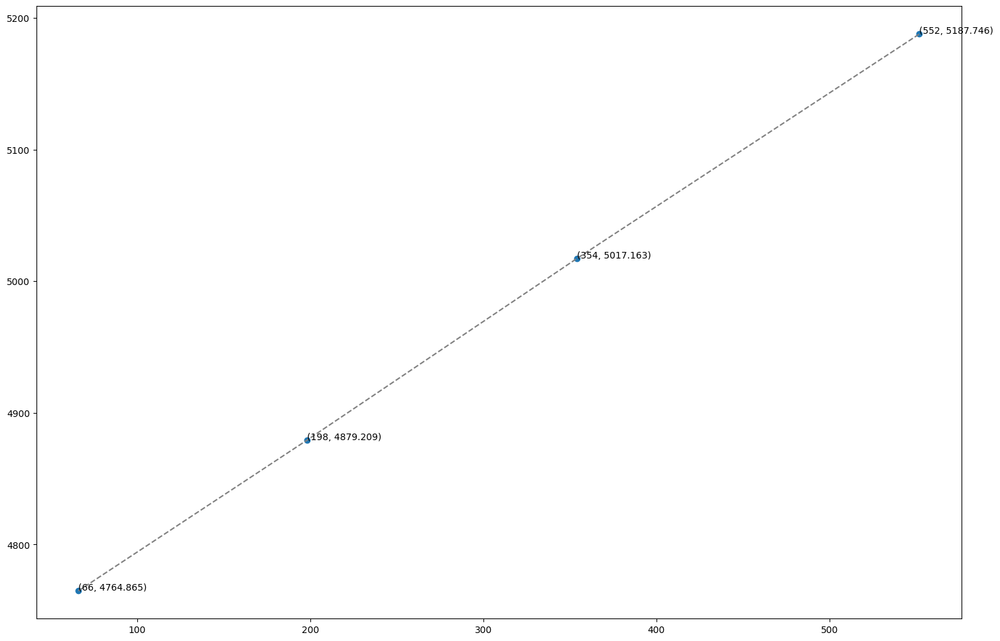

In [ ]:
plt.plot(peaks_blue, wavelenght_calib_blu, '--', color="gray")
plt.scatter(peaks_blue, wavelenght_calib_blu)
for i, j in zip(peaks_blue, wavelenght_calib_blu):
   plt.text(i, j+0.5, '({}, {})'.format(i, j))

Text(0, 0.5, 'wavelenght')

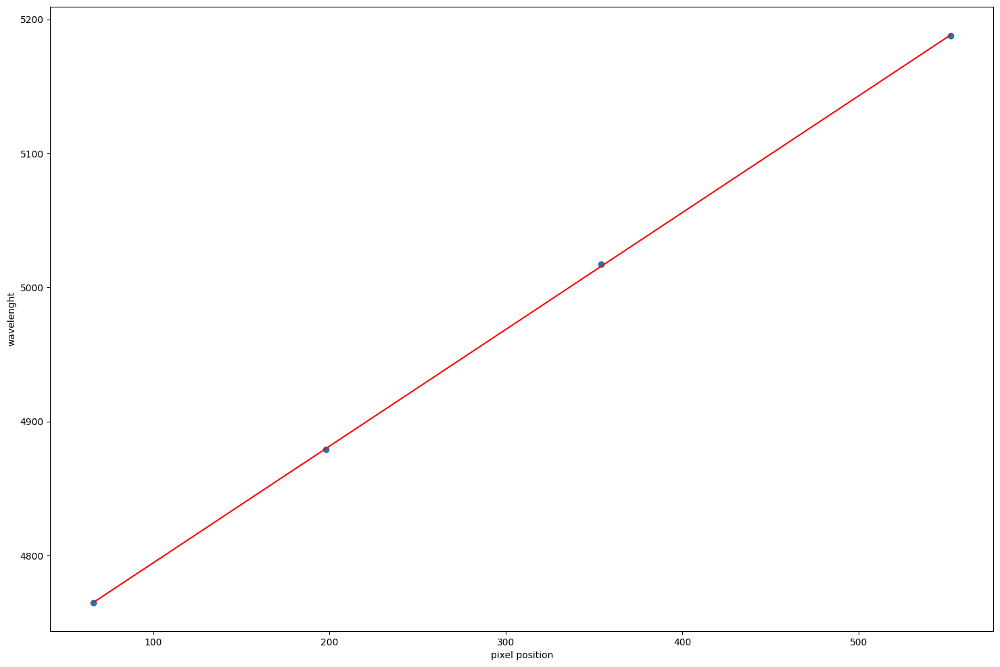

In [ ]:
# Create linear regression object
fit_blue = np.polyfit(peaks_blue,wavelenght_calib_blu,1)
wavelenght_pred_blu = np.polyval(fit_blue, peaks_blue)

# Plot outputs
plt.scatter(peaks_blue, wavelenght_calib_blu)
plt.plot(peaks_blue, wavelenght_pred_blu, color="red")
plt.xlabel("pixel position")
plt.ylabel("wavelenght")

In [ ]:
print("the conversion between pixel and wavelenght is: lambda = ", round(fit_blue[0],4), "* pixel + ", round(fit_blue[1],2))

the conversion between pixel and wavelenght is: lambda =  0.8713 * pixel +  4707.39


In [ ]:
peaks_all = []
peaks_all[:4] = peaks_blue
peaks_all[4:] = peaks_red
print(peaks_all)
wavelenght_calib_all = []
wavelenght_calib_all[:4] = wavelenght_calib_blu
wavelenght_calib_all[4:] = wavelenght_calib_red
print(wavelenght_calib_all)

[66, 198, 354, 552, 1329, 1360, 1439, 1620, 1676, 1825, 1966, 1990, 2118, 2328, 2687]
[4764.865, 4879.209, 5017.163, 5187.746, 5852.488, 5881.895, 5944.834, 6096.163, 6143.063, 6266.495, 6382.992, 6402.246, 6506.528, 6678.276, 6965.491]


Text(0, 0.5, 'wavelenght')

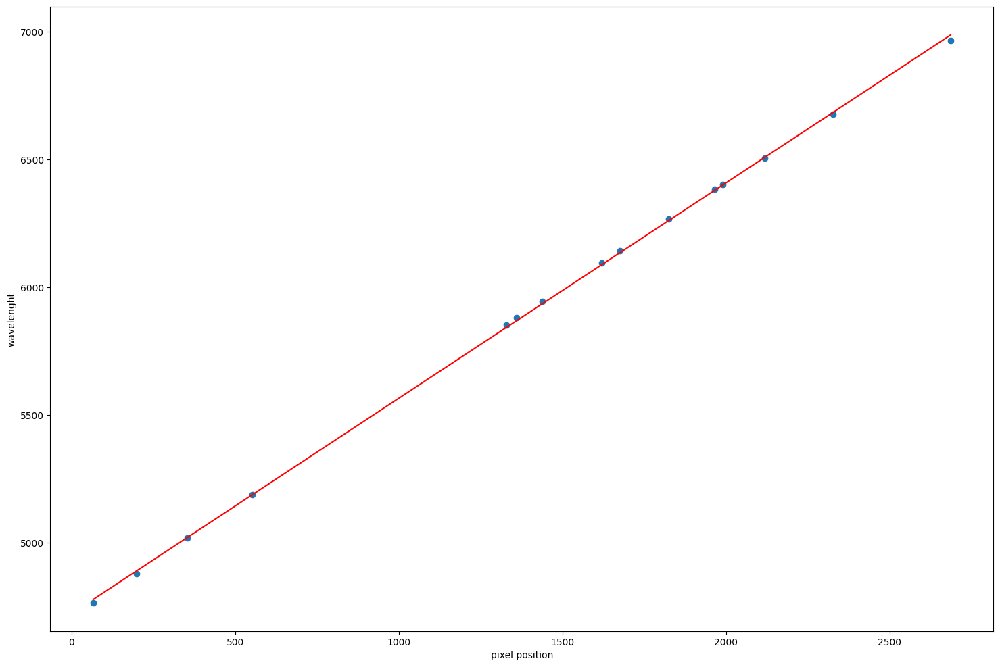

In [ ]:
# Create linear regression object
fit_all = np.polyfit(peaks_all,wavelenght_calib_all,1)
wavelenght_pred_all = np.polyval(fit_all, peaks_all)

# Plot outputs
plt.scatter(peaks_all, wavelenght_calib_all)
plt.plot(peaks_all, wavelenght_pred_all, color="red")
plt.xlabel("pixel position")
plt.ylabel("wavelenght")

### Regression of both blue and red

Create linear regression object for blue and red at the same time

In [ ]:
print("the wavelenght solution (only red) is: lambda = ", round(fit_red[0],4), "* pixel + ", round(fit_red[1],2))
print("the wavelenght solution (only blu) is: lambda = ", round(fit_blue[0],4), "* pixel + ", round(fit_blue[1],2))
print("the wavelenght solution (blu and red) is: lambda = ", round(fit_all[0],4), "* pixel + ", round(fit_all[1],2))

the wavelenght solution (only red) is: lambda =  0.8208 * pixel +  4766.09
the wavelenght solution (only blu) is: lambda =  0.8713 * pixel +  4707.39
the wavelenght solution (blu and red) is: lambda =  0.8437 * pixel +  4721.5


In [ ]:
def pixel_to_wavelength(pixel):
    return fit_all[0]*pixel + fit_all[1]

#Waveleangth calibration

In [ ]:
wave = pixel_to_wavelength(xarr)
flux = star_spec
wave = wave[:-9]
flux = flux[:-9]

Text(0, 0.5, 'flux ')

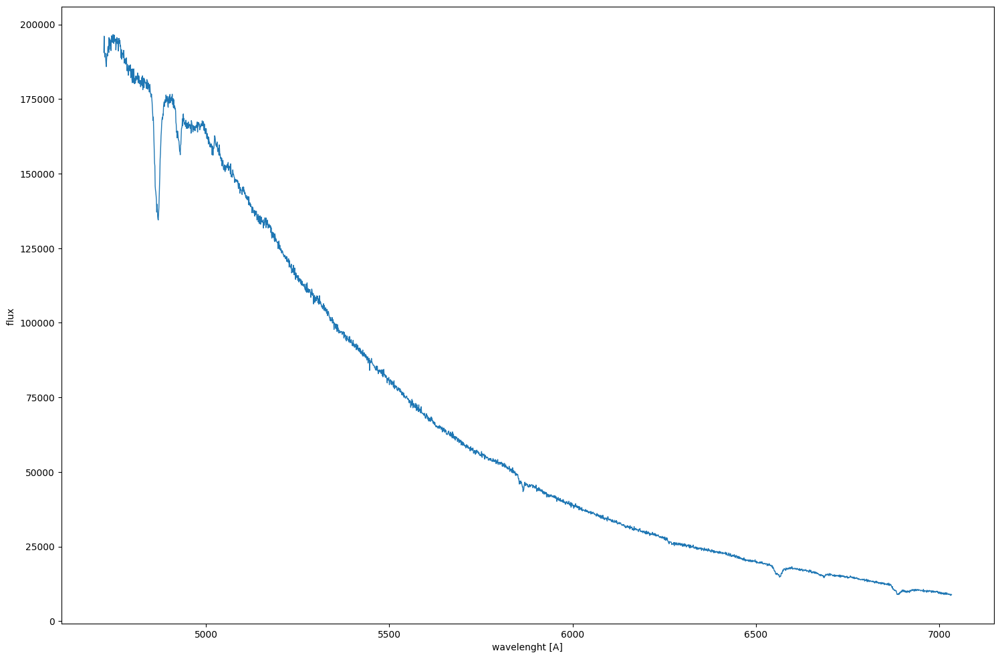

In [ ]:
#plot std_flux vs wavelenght
plt.plot(wave, flux, linewidth=1.0)
plt.xlabel("wavelenght [A]")
plt.ylabel("flux ")

In [ ]:
HD3360_emissions = pd.read_csv(path_drive+"science/fhr153.dat",sep=r"\s+",header=None,names=["wavelength_A","flux_ergs/cm/cm/s/A","flux_milli_Jy"])
wlen_std = HD3360_emissions['wavelength_A'].to_numpy()
flux_std = HD3360_emissions['flux_ergs/cm/cm/s/A'].to_numpy()

In [ ]:
#Flux is in units of 1E-16 erg/ s / cm^2 /A

In [ ]:
cut = wlen_std>4750
wlen_std = wlen_std[cut]
flux_std = flux_std[cut]

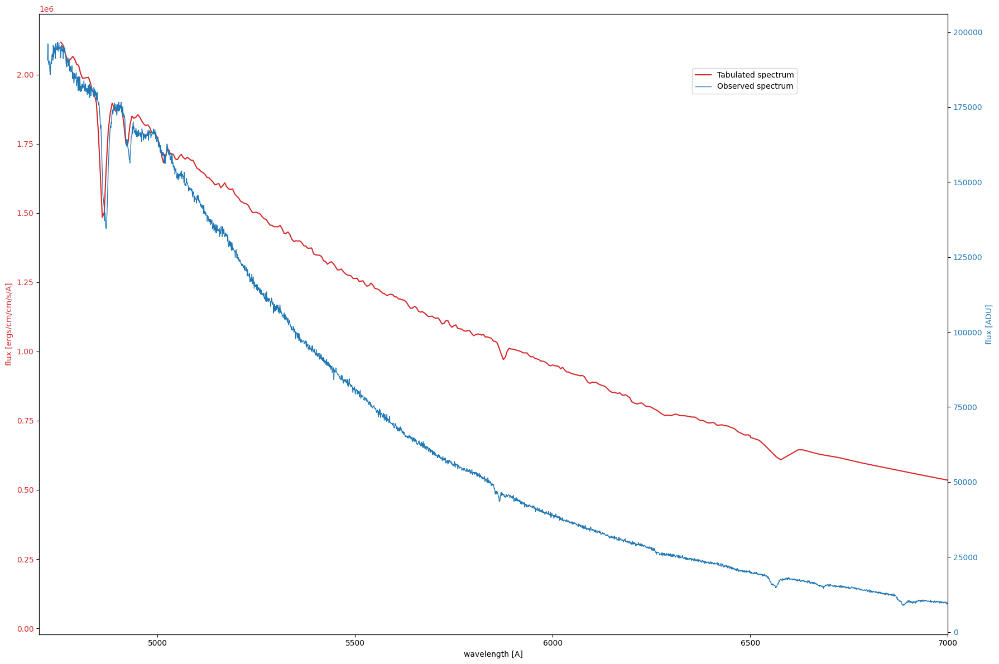

<Figure size 12500x10000 with 0 Axes>

In [ ]:
#plot std_star_spectrum_tabulated and STD_flux_WV on two Y axis twinned
fig, ax1 = plt.subplots()
plt.figure(figsize=(25, 20), dpi=500)
color = 'tab:red'
ax1.set_xlabel('wavelength [A]')
ax1.set_ylabel('flux [ergs/cm/cm/s/A]', color=color)
ax1.plot(wlen_std, flux_std, color=color, label="Tabulated spectrum")
ax1.tick_params(axis='y', labelcolor=color)
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('flux [ADU]', color=color)  # we already handled the x-label with ax1
ax2.plot(wave, flux, color=color, linewidth=1, label="Observed spectrum")
ax2.tick_params(axis='y', labelcolor=color)
ax1.set_xlim(4700,7000)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
fig.legend(bbox_to_anchor=(0.8, 0.9))

#Throughput calibration

In [ ]:
from scipy.interpolate import interp1d

# Cutting the arrays wlen_std and flux_std
cut = wlen_std > 4750
wlen_std_cut = wlen_std[cut]
flux_std_cut = flux_std[cut]

# Inverse interpolation to align the wave and flux arrays
inverse_interpolator = interp1d(wlen_std_cut, flux_std_cut, kind='linear', fill_value='extrapolate')
flux_known_interpolated = inverse_interpolator(wave)

# Calculation of the response function
response_function = flux_known_interpolated / flux

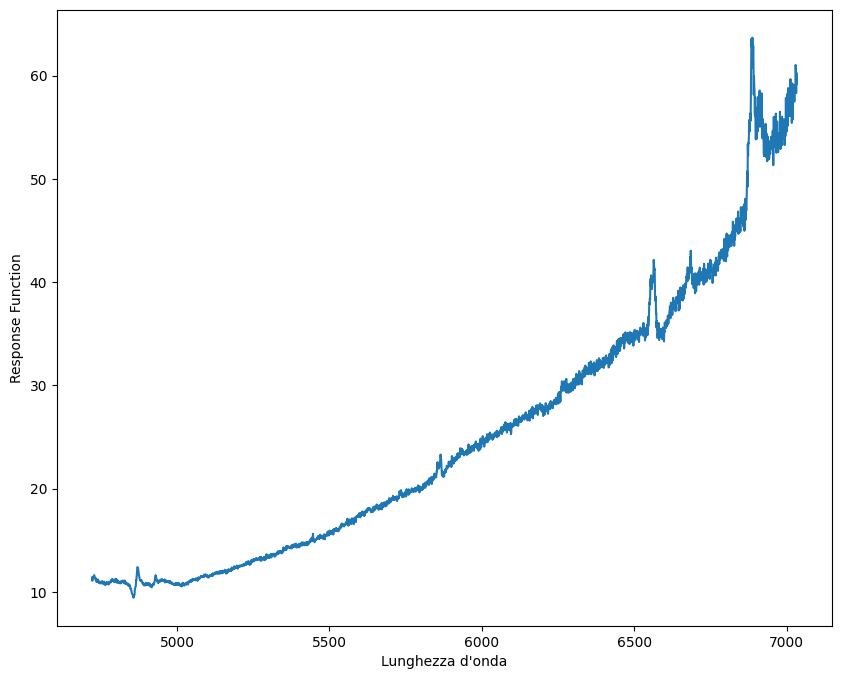

In [ ]:
plt.figure(figsize=(10, 8))
plt.plot(wave, response_function)
plt.xlabel('Lunghezza d\'onda')
plt.ylabel('Response Function')
plt.show()